### EDA 3 - examine annotations in context of images
----
Use the revised annotations here

In [213]:
import numpy as np
import os, sys, json
import PIL
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from ast import literal_eval
import warnings
warnings.filterwarnings('ignore')

img_dir = '../../../rf-chess-data/roboflow/export/'
img_fns = os.listdir(img_dir)
crop_dir = '../../../rf-chess-data/cropped_verify/'

!ls ../../../rf-chess-data/roboflow/export/*.json

../../../rf-chess-data/roboflow/export/_annotations.coco.json
../../../rf-chess-data/roboflow/export/_annotations_v2.coco.json


In [98]:
annotate_fn = '_annotations_v2.coco.json'

with open(Path(img_dir, annotate_fn), 'r') as f:
    d_annotate = json.load(f)
    
d_annotate.keys()

dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

In [99]:
df_annotate = pd.DataFrame(d_annotate['annotations'])
df_images = pd.DataFrame(d_annotate['images'])
df_categories = pd.DataFrame(d_annotate['categories'])

In [100]:
df = pd.read_csv('../data/rf-annotate/data_v1.1.csv')
df['bbox'] = df['bbox'].map(lambda x: literal_eval(x))

### Analyze the camera position and board position

In [102]:
fns = df_images['file_name']
N = len(fns)
N, N ** 0.5

(289, 17.0)

In [ ]:
fns = df_images['file_name']
c1,c2,c3,c4 = 100,200,350,450
base = np.ndarray((1700, 1700, 3), dtype='uint')

counter = 0
for img_fn in  fns:
    img_pil = PIL.Image.open(Path(img_dir, img_fn))
    img_np = np.array(img_pil)
    clip = img_np[c1:c2, c3:c4,:]
    x = (counter % 17) * 100
    y = (counter // 17) * 100
    base[y:y+100,x:x+100,:] = clip
    counter += 1

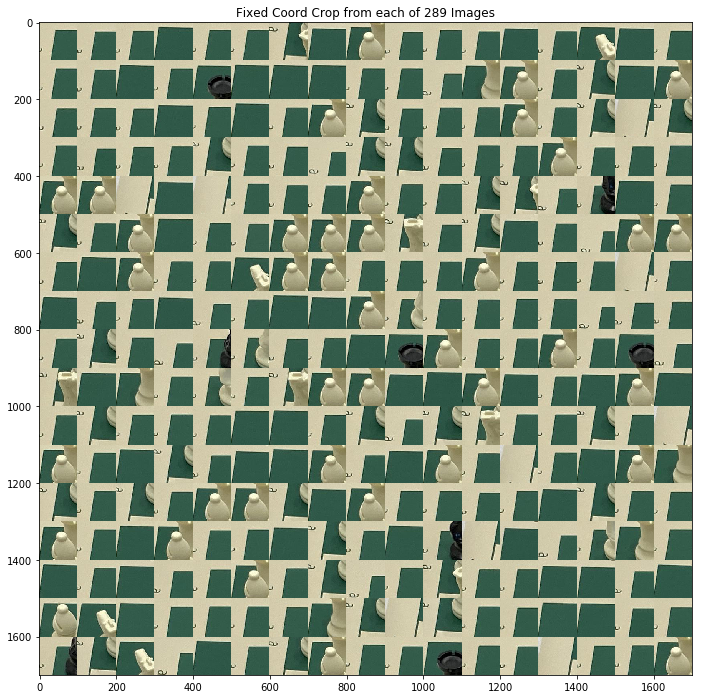

In [83]:
plt.figure(figsize=(12,12))
plt.imshow(base)
plt.title(f'Fixed Coord Crop from each of {N} Images');

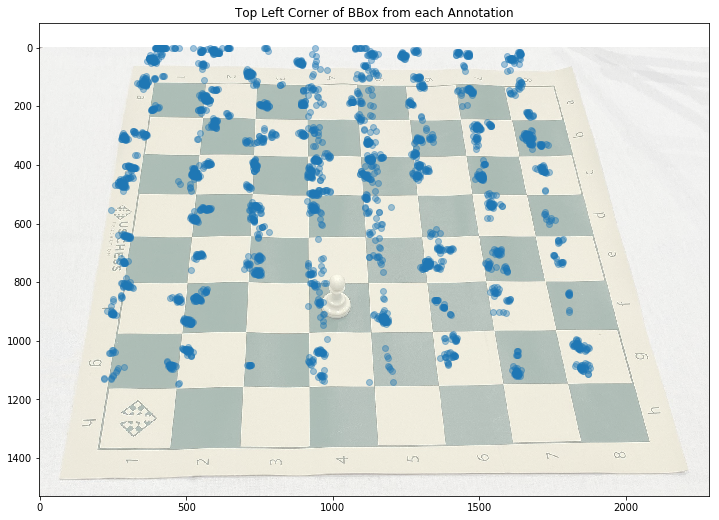

In [103]:
background = np.array(PIL.Image.open(Path(img_dir, fns[0])))

y_max, x_max, _ = background.shape
x_corner = df_join['bbox'].map(lambda x: x[0])
y_corner = df_join['bbox'].map(lambda x: x[1])

plt.figure(figsize=(12,12))
plt.imshow(background, alpha=0.4);
plt.scatter(x_corner, y_corner, alpha=0.4);
plt.title('Top Left Corner of BBox from each Annotation');

### Analyze individual pieces

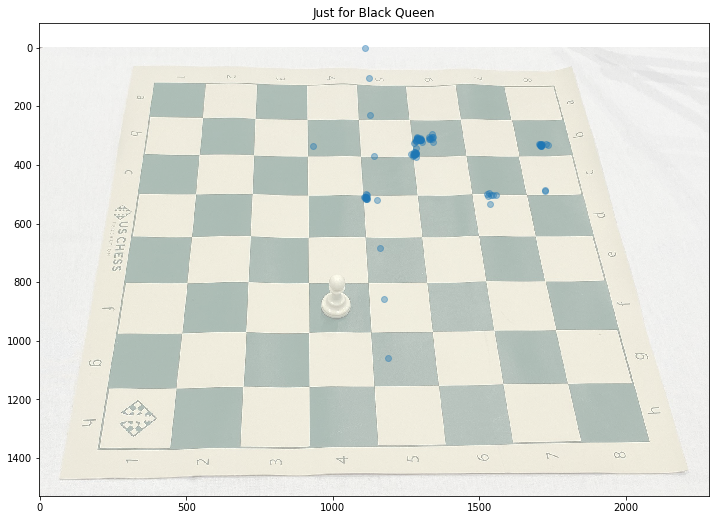

In [210]:
bq = df[df['category_full_name'] == 'black-queen']

annots = bq.copy()

background = np.array(PIL.Image.open(Path(img_dir, fns[0])))

y_max, x_max, _ = background.shape
x_corner = annots['bbox'].map(lambda x: x[0])
y_corner = annots['bbox'].map(lambda x: x[1])

plt.figure(figsize=(12,12))
plt.imshow(background, alpha=0.4);
plt.scatter(x_corner, y_corner, alpha=0.4);
plt.title('Just for Black Queen');

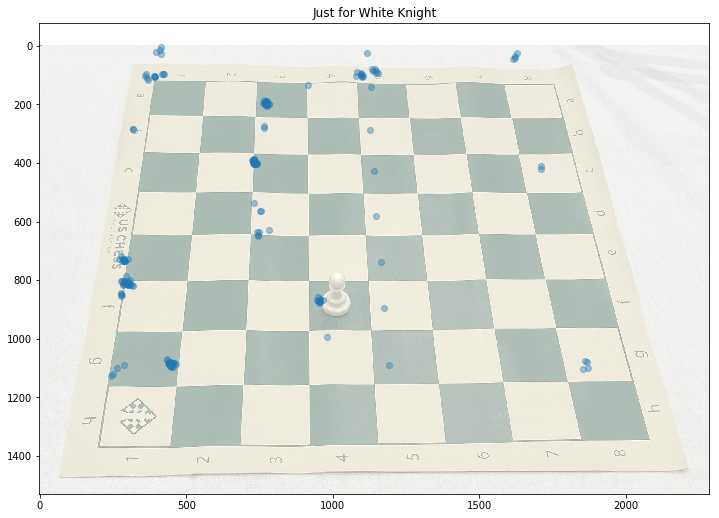

In [211]:
bq = df[df['category_full_name'] == 'white-knight']

annots = bq.copy()

background = np.array(PIL.Image.open(Path(img_dir, fns[0])))

y_max, x_max, _ = background.shape
x_corner = annots['bbox'].map(lambda x: x[0])
y_corner = annots['bbox'].map(lambda x: x[1])

plt.figure(figsize=(12,12))
plt.imshow(background, alpha=0.4);
plt.scatter(x_corner, y_corner, alpha=0.4);
plt.title('Just for White Knight');

### Group Images by `min_dist` to any of the other annotations

In [212]:
bq = df[df['category_full_name'] == 'black-queen']

In [135]:
corners = bq['bbox'].map(lambda x: (x[0], x[1])).tolist()

def dist(a,b):
    return ((a[0] - b[0])**2 + (a[1] - b[1])**2)**0.5

min_dist = [ min([dist(c1, c2) 
                  for i2, c2 in enumerate(corners) if i2 != i1]) 
            for i1, c1 in enumerate(corners)]

In [136]:
bq['min_dist'] = min_dist
bq['min_dist_r4'] = bq['min_dist'].round(4)

In [147]:
vcs = bq['min_dist_r4'].value_counts()

In [149]:

tmp = bq[bq['min_dist_r4'] == dist]

In [163]:
ifns = [str(e).zfill(5) for e in tmp.index]

In [164]:

crop_fns = os.listdir(crop_dir)

In [184]:
clip_fns = [[e for e in crop_fns if ifn in e][0] for ifn in ifns]
clips = [PIL.Image.open(crop_dir + fn) for fn in clip_fns]

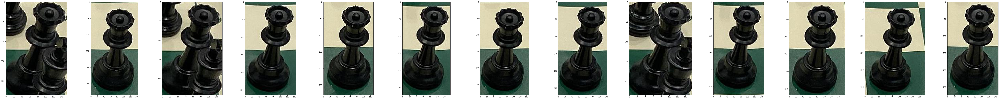

In [186]:
n = len(clips)
fig, ax = plt.subplots(nrows=1, ncols=n, figsize=(8 * n,10));
for i, pil in enumerate(clips):
    ax[i].imshow(np.array(pil))
plt.show()

### Group Images by their `twin_set`

In [215]:
corners = bq['bbox'].map(lambda x: (x[0], x[1])).tolist()
thresh = 10

twins = [ [ i2 for i2, c2 in enumerate(corners) 
                  if (i2 != i1) and (dist(c1, c2) < thresh)] 
              for i1, c1 in enumerate(corners)]

In [216]:
def sorter(i,v):
    x = list(set([i] + v))
    x.sort()
    return x

twin_sets = [sorter(i,v) for i,v in enumerate(twins)]

In [217]:
bq['twin_sets'] = twin_sets
bq['twin_sets_obj'] = bq['twin_sets'].map(str)

In [218]:
amts = bq.groupby('twin_sets_obj').agg('count').iloc[:,1]

In [219]:
amts.sort_values(ascending=False)[:10]

twin_sets_obj
[1, 4, 8, 10, 22, 43, 44, 53, 65, 68, 75, 84]       12
[6, 16, 20, 32, 33, 39, 47, 60, 69, 86]              4
[7, 14, 23, 28, 40, 54, 56, 62, 63, 79, 81]          3
[27, 74]                                             2
[18, 29, 37, 38, 46, 48, 57, 59, 66, 67, 72, 78]     2
[42, 49]                                             2
[45, 58]                                             2
[6, 16, 20, 30, 32, 33, 39, 47, 60, 69, 86]          2
[6, 16, 20, 32, 33, 47, 60, 69, 86]                  2
[21, 40, 50, 52, 56, 70, 79, 81, 83]                 2
Name: bbox, dtype: int64

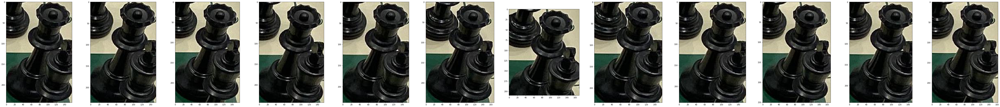

In [225]:
# for i in range(len(vcs)):
twin_code = amts.sort_values(ascending=False).index[0]

tmp = bq[bq['twin_sets_obj'] == twin_code]

ifns = [str(e).zfill(5) for e in tmp.index]

crop_dir = '../../../rf-chess-data/cropped_verify/'
crop_fns = os.listdir(crop_dir)

clip_fns = [[e for e in crop_fns if ifn in e][0] for ifn in ifns]
clips = [PIL.Image.open(crop_dir + fn) for fn in clip_fns]

n = len(clips)
fig, ax = plt.subplots(nrows=1, ncols=n, figsize=(8 * n, 10));
for i, pil in enumerate(clips):
    ax[i].imshow(np.array(pil))
plt.show()

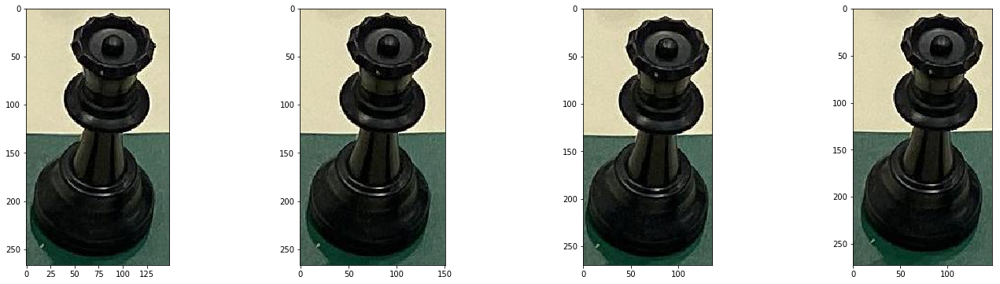

In [222]:
twin_code = amts.sort_values(ascending=False).index[1]

tmp = bq[bq['twin_sets_obj'] == twin_code]

ifns = [str(e).zfill(5) for e in tmp.index]

crop_dir = '../../../rf-chess-data/cropped_verify/'
crop_fns = os.listdir(crop_dir)

clip_fns = [[e for e in crop_fns if ifn in e][0] for ifn in ifns]
clips = [PIL.Image.open(crop_dir + fn) for fn in clip_fns]

n = len(clips)
fig, ax = plt.subplots(nrows=1, ncols=n, figsize=(6 * n, 6));
for i, pil in enumerate(clips):
    ax[i].imshow(np.array(pil))
plt.show()

### Cluster twin_set's 

In [306]:
# bq['twin_sets_len'] = bq['twin_sets'].map(lambda x:len(x))
# tmp  = bq[['twin_sets', 'twin_sets_len']]

In [307]:
def make_set(s1, s2):
    
    shared_1 = [e for e in s1 if e in s2]
    
    if len(shared_1) < 0.5 * len(s1):
        return s1
    
    ret = list(set(s1).union(s2))
    ret.sort()
    return ret

def big_set(*args):
    ret = [(len(e), e) for e in args]
    ret.sort(reverse=True, key=lambda x: x[0])
    return ret[0][1]

In [308]:
list_ts = bq['twin_sets'].tolist()
out = list_ts.copy()
for _ in range(10):
    out = [ big_set(*[make_set(ts1, ts2) for ts2 in out]) for ts1 in out]

In [310]:
out[:5]

[[0],
 [1, 4, 8, 10, 22, 43, 44, 53, 65, 68, 75, 84],
 [2, 18, 29, 37, 38, 46, 48, 57, 59, 66, 67, 72, 73, 78],
 [3, 24, 26],
 [1, 4, 8, 10, 22, 43, 44, 53, 65, 68, 75, 84]]

In [311]:
bq['twin_set_cluster'] = out
bq['twin_set_cluster_obj'] = bq['twin_set_cluster'].map(str)

In [314]:
amts = bq.groupby('twin_set_cluster_obj').agg('count').iloc[:,1]

[7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83]


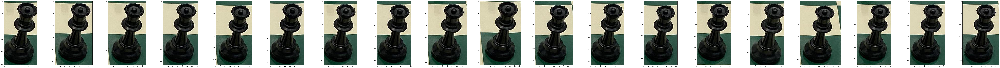

In [324]:
ind = 0

twin_code = amts.sort_values(ascending=False).index[ind]

tmp = bq[bq['twin_set_cluster_obj'] == twin_code]

ifns = [str(e).zfill(5) for e in tmp.index]

crop_dir = '../../../rf-chess-data/cropped_verify/'
crop_fns = os.listdir(crop_dir)

clip_fns = [[e for e in crop_fns if ifn in e][0] for ifn in ifns]
clips = [PIL.Image.open(crop_dir + fn) for fn in clip_fns]

n = len(clips)
fig, ax = plt.subplots(nrows=1, ncols=n, figsize=(8 * n, 10));
for i, pil in enumerate(clips):
    ax[i].imshow(np.array(pil))
print(twin_code)
plt.show()

[7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83]
[2, 18, 29, 37, 38, 46, 48, 57, 59, 66, 67, 72, 73, 78]
[5, 6, 16, 20, 30, 32, 33, 39, 47, 60, 69, 86]
[1, 4, 8, 10, 22, 43, 44, 53, 65, 68, 75, 84]
[9, 17, 19, 35, 55, 71, 85]
[3, 24, 26]
[45, 58]
[42, 49]
[27, 74]


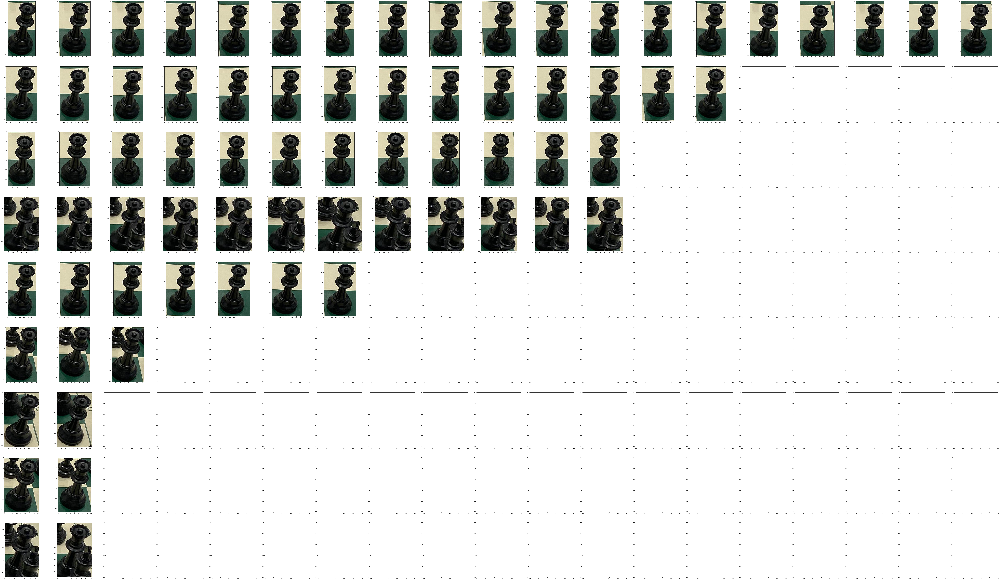

In [335]:
max_show = 99

matched = amts[amts > 1]
iters = matched.sort_values(ascending=False).index[:max_show]

cols = max([e.count(',') + 1 for e in iters])
rows = len(iters)

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(8 * cols, 10 * rows));

for irow, twin_code in enumerate(iters):

    tmp = bq[bq['twin_set_cluster_obj'] == twin_code]

    ifns = [str(e).zfill(5) for e in tmp.index]

    clip_fns = [[e for e in os.listdir(crop_dir) if ifn in e][0] for ifn in ifns]
    clips = [PIL.Image.open(crop_dir + fn) for fn in clip_fns]

    cols = len(clips)
    
    for icol, pil in enumerate(clips):
        ax[irow][icol].imshow(np.array(pil))
    
    print(twin_code)
    
plt.show()

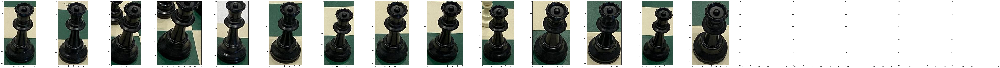

In [346]:
max_show=99

matched = amts[amts == 1]
iters = matched.index[:max_show]

cols = max([e.count(',') + 1 for e in amts[amts > 1].index])
rows = min(2, (len(matched) // cols) + 1)

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(8 * cols, 10 * rows));
ax = ax.ravel()
counter = 0
for idata, twin_code in enumerate(iters):

    tmp = bq[bq['twin_set_cluster_obj'] == twin_code]

    ifns = [str(e).zfill(5) for e in tmp.index]

    clip_fns = [[e for e in os.listdir(crop_dir) if ifn in e][0] for ifn in ifns]
    clips = [PIL.Image.open(crop_dir + fn) for fn in clip_fns]

    for pil in clips:
        ax[counter].imshow(np.array(pil))
        counter += 1
    
#     print(twin_code)
    
plt.show()

In [309]:
show = out.copy()
show.sort(key=lambda x: len(x) + 0.0001*x[0], reverse=True)
show

[[7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70, 79, 81, 83],
 [7, 11, 13, 14, 21, 23, 28, 40, 50, 51, 52, 54, 56, 62, 63, 70,

In [241]:
tmp.sort_values(by='twin_sets_len', ascending=False)

,twin_sets,twin_sets_len
2667,"[11, 14, 21, 23, 28, 40, 50, 52, 56, 62, 63, 7...",15
2624,"[14, 21, 23, 28, 40, 50, 52, 54, 56, 62, 63, 7...",15
1278,"[14, 21, 23, 28, 40, 52, 54, 56, 62, 63, 70, 7...",14
2715,"[11, 13, 14, 21, 40, 50, 52, 56, 62, 70, 79, 8...",13
1860,"[14, 21, 23, 28, 40, 54, 56, 62, 63, 70, 79, 8...",13
1392,"[1, 4, 8, 10, 22, 43, 44, 53, 65, 68, 75, 84]",12
1231,"[18, 29, 37, 38, 46, 48, 57, 59, 66, 67, 72, 78]",12
727,"[1, 4, 8, 10, 22, 43, 44, 53, 65, 68, 75, 84]",12
19,"[1, 4, 8, 10, 22, 43, 44, 53, 65, 68, 75, 84]",12
1744,"[1, 4, 8, 10, 22, 43, 44, 53, 65, 68, 75, 84]",12
